#### FREESURFER

FreeSurfer is a software package that enables you to analyze structural MRI images - in other words, you can use FreeSurfer to quantify the amount of grey matter and white matter in specific regions of the brain. You will also be able to calculate measurements such as the thickness, curvature, and volume of the different tissue types as features, and be able to correlate these with covariates; or, you can contrast these structural measurements between groups.

In [2]:
import os
from IPython.display import Image

from nilearn import plotting
import nipype.pipeline.engine as pe
import nipype.interfaces.io as nio
from nipype.interfaces.freesurfer.preprocess import ReconAll
from nipype.interfaces.freesurfer.utils import MakeAverageSubject

import warnings
warnings.filterwarnings('ignore')

/opt/miniconda-latest/envs/neuro/lib/python3.9/site-packages/nilearn/datasets/__init__.py:86: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


Lets have a quick look at command interface of freesurfer. \
Freesurfer initialize begins with recon-all command. However, there a number of command you can work with data: convertation, group analysis, transormation.

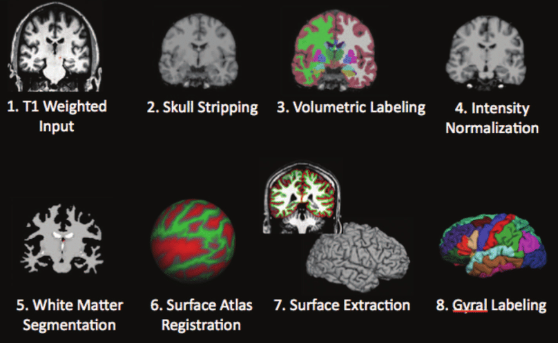

In [15]:
Image(filename = "/workspace/assets/freesurfer_stream.png", width=600, height=800)

In [7]:
reconall = ReconAll()
reconall.inputs.subject_id = '100206'
reconall.inputs.directive = 'autorecon1'
reconall.inputs.subjects_dir = '/workspace/data'
reconall.inputs.T1_files = '/workspace/data/raw/100206/unprocessed/3T/T1w_MPR1/100206_3T_T1w_MPR1.nii.gz'
print(reconall.cmdline)
reconall.run()

recon-all -autorecon1 -i /workspace/data/raw/100206/unprocessed/3T/T1w_MPR1/100206_3T_T1w_MPR1.nii.gz -subjid 100206 -sd /workspace/data
210910-15:30:46,412 nipype.interface INFO:
	 stdout 2021-09-10T15:30:46.412415:Subject Stamp: freesurfer-Linux-centos6_x86_64-stable-pub-v6.0.1-f53a55a
210910-15:30:46,415 nipype.interface INFO:
	 stdout 2021-09-10T15:30:46.412415:Current Stamp: freesurfer-Linux-centos6_x86_64-stable-pub-v6.0.1-f53a55a
210910-15:30:46,428 nipype.interface INFO:
	 stdout 2021-09-10T15:30:46.428595:INFO: SUBJECTS_DIR is /workspace/data
210910-15:30:46,430 nipype.interface INFO:
	 stdout 2021-09-10T15:30:46.430413:Actual FREESURFER_HOME /opt/freesurfer-6.0.1
210910-15:30:46,588 nipype.interface INFO:
	 stdout 2021-09-10T15:30:46.588761:Linux b1ab6fa802ea 5.10.25-linuxkit #1 SMP Tue Mar 23 09:27:39 UTC 2021 x86_64 x86_64 x86_64 GNU/Linux
210910-15:30:46,706 nipype.interface INFO:
	 stderr 2021-09-10T15:30:46.706282:nu_correct: Command not found.
210910-15:30:47,279 nipype

KeyboardInterrupt: 

Usually it takes 6-18 hours to preprocess for 1 subject, better thick of parallelization:

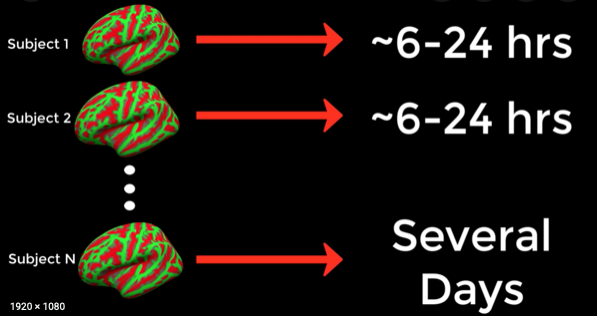

In [16]:
Image(filename = "/workspace/assets/freesurfer_runtime.png", width=600, height=800)

In [17]:
!cat /workspace/multiproc.sh

#! /bin/bash

export SUBJECTS_DIR=/workspace
export input_path=/workspace/data/raw

ids=()

for dirname in /${input_path}/*; do

    subj_id=${dirname#/${input_path}/}  # remove "/input/sub-"
    subj_id=${subj_id%/}  # remove trailing "/"

    if [[ ! -d "/output/$subj_id" ]]; then
        ids+=( "$subj_id" )
    fi
done

printf 'Found ID: %s\n' "${ids[@]}" >&2

printf '%s\n' "${ids[@]}" | parallel --jobs 10 --timeout 250% --progress recon-all -expert /workspace/data/expert.opts -s {.} -i ${input_path}/{.}/unprocessed/3T/T1w_MPR1/{.}_3T_T1w_MPR1.nii.gz -all -qcache

Output sctructure of freesurfer preprocessing.

In [18]:
!tree ./data/freesurfer_preproc --filelimit 40

./data/freesurfer_preproc
└── 100206
    ├── label [73 entries exceeds filelimit, not opening dir]
    ├── mri [64 entries exceeds filelimit, not opening dir]
    ├── stats
    │   ├── aseg.stats
    │   ├── lh.aparc.a2009s.stats
    │   ├── lh.aparc.DKTatlas40.stats
    │   ├── lh.aparc.stats
    │   ├── lh.BA.stats
    │   ├── lh.BA.thresh.stats
    │   ├── lh.curv.stats
    │   ├── lh.entorhinal_exvivo.stats
    │   ├── rh.aparc.a2009s.stats
    │   ├── rh.aparc.DKTatlas40.stats
    │   ├── rh.aparc.stats
    │   ├── rh.BA.stats
    │   ├── rh.BA.thresh.stats
    │   ├── rh.curv.stats
    │   ├── rh.entorhinal_exvivo.stats
    │   └── wmparc.stats
    ├── surf [122 entries exceeds filelimit, not opening dir]
    └── touch [61 entries exceeds filelimit, not opening dir]

6 directories, 16 files


#### Freesurfer Output Visualization

In [6]:
import matplotlib
cdict = {'red': ((0.0, 0.0, 0.0),
                 (0.1, 0.5, 0.5),
                 (0.2, 0.0, 0.0),
                 (0.4, 0.2, 0.2),
                 (0.6, 0.0, 0.0),
                 (0.8, 1.0, 1.0),
                 (1.0, 1.0, 1.0)),
        'green':((0.0, 0.0, 0.0),
                 (0.1, 0.0, 0.0),
                 (0.2, 0.0, 0.0),
                 (0.4, 1.0, 1.0),
                 (0.6, 1.0, 1.0),
                 (0.8, 1.0, 1.0),
                 (1.0, 0.0, 0.0)),
        'blue': ((0.0, 0.0, 0.0),
                 (0.1, 0.5, 0.5),
                 (0.2, 1.0, 1.0),
                 (0.4, 1.0, 1.0),
                 (0.6, 0.0, 0.0),
                 (0.8, 0.0, 0.0),
                 (1.0, 0.0, 0.0))}

my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,256)
my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,64,1.9)

For example, lets plot cortical thickness on inflated and pial surfaces.

In [30]:
inflated_path = '/workspace/data/freesurfer_preproc/100206/surf/lh.inflated'
pial_path = ''
thickness_data = '/workspace/data/freesurfer_preproc/100206/surf/lh.thickness'
plot_pial_lh = plotting.view_surf(inflated_path, thickness_data, threshold=0, cmap=my_cmap, black_bg=True)
plot_pial_lh

Plot cortical and subcortical segmentation maps

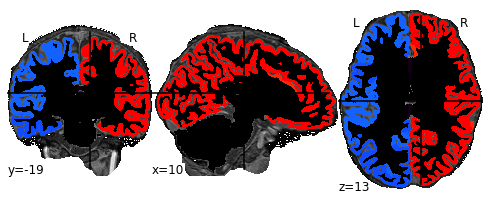

In [7]:
plotting.plot_img('/workspace/data/freesurfer_preproc/100206/mri/aparc+aseg.mgz', bg_img='/workspace/data/freesurfer_preproc/100206/mri/brain.mgz',cmap=my_cmap,threshold=0.3)

The FreeSurfer utilities mris_ca_train and mris_ca_label together implement a technique for automatically assigning a neuroanatomical label to each location on a cortical surface model based on probabilistic information estimated from a manually labeled training set (made using FreeSurfer). This procedure incorporates both geometric information derived from the cortical model, and neuroanatomical convention, as found in the training set. The result is a complete labeling of cortical sulci and gyri.

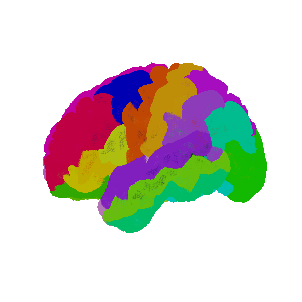

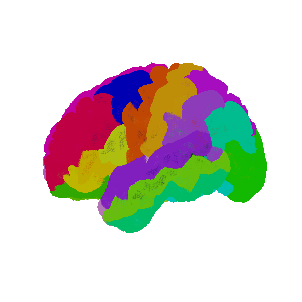

In [11]:
import numpy as np

labels, ctab, shape = nibabel.freesurfer.io.read_annot('/workspace/data/freesurfer_preproc/100206/label/lh.aparc.annot')
plotting.plot_surf_roi(pial_path, roi_map=labels,
                       hemi='left', view='lateral',
                       bg_on_data=True,
                       darkness=.5)

#### Extract features from stats data:

After recon-all finishes, there will be a file called subject/stats/aseg.stats. This is a table of volume and intensity statistics for each segmentation. It also contains the following metrics:
https://surfer.nmr.mgh.harvard.edu/fswiki/MorphometryStats

In [18]:
!cat /workspace/data/freesurfer_preproc/100206/stats/aseg.stats

# Title Segmentation Statistics 
# 
# generating_program mri_segstats
# cvs_version $Id: mri_segstats.c,v 1.75.2.9 2013/02/16 00:09:33 greve Exp $
# cmdline mri_segstats --seg mri/aseg.mgz --sum stats/aseg.stats --pv mri/norm.mgz --empty --brainmask mri/brainmask.mgz --brain-vol-from-seg --excludeid 0 --excl-ctxgmwm --supratent --subcortgray --in mri/norm.mgz --in-intensity-name norm --in-intensity-units MR --etiv --surf-wm-vol --surf-ctx-vol --totalgray --euler --ctab /export/freesurfer-5.3-HCP/ASegStatsLUT.txt --subject 100206 
# sysname  Linux
# hostname node166
# machine  x86_64
# user     HCPpipeline
# anatomy_type volume
# 
# SUBJECTS_DIR /HCP/hcpdb/build_ssd/chpc/BUILD/HCP_Staging/1430803822_100206/STRUCTURAL/100206/T1w
# subjectname 100206
# Measure BrainSeg, BrainSegVol, Brain Segmentation Volume, 1406924.000000, mm^3
# Measure BrainSegNotVent, BrainSegVolNotVent, Brain Segmentation Volume Without Ventricles, 1389007.000000, mm^3
# Measure BrainSegNotVentSurf, BrainSegVolNotVe

In [19]:
import pandas as pd
seg_data_path = '/workspace/data/freesurfer_preproc/100206/stats/aseg.stats'

ColHeader = next(filter(lambda line: line.startswith('# ColHeaders'), open(seg_data_path).readlines()))
names = ColHeader.split()[2:]
data = pd.read_csv(seg_data_path, names=names, comment='#', delim_whitespace=True, dtype=str)
data

,Index,SegId,NVoxels,Volume_mm3,StructName,normMean,normStdDev,normMin,normMax,normRange
0,1,4,5057,5056.7,Left-Lateral-Ventricle,40.0167,14.4494,17.0000,110.0000,93.0000
1,2,5,399,399.4,Left-Inf-Lat-Vent,42.0814,15.0058,17.0000,80.0000,63.0000
2,3,7,16807,16807.5,Left-Cerebellum-White-Matter,87.9193,6.1152,31.0000,107.0000,76.0000
3,4,8,62713,62713.3,Left-Cerebellum-Cortex,67.0515,9.3807,17.0000,103.0000,86.0000
4,5,10,10426,10426.3,Left-Thalamus-Proper,99.0471,8.3502,51.0000,124.0000,73.0000
5,6,11,4599,4598.8,Left-Caudate,81.9797,7.4729,45.0000,112.0000,67.0000
6,7,12,5941,5940.8,Left-Putamen,87.2295,7.0701,56.0000,109.0000,53.0000
7,8,13,1463,1462.8,Left-Pallidum,91.6341,7.3817,58.0000,114.0000,56.0000
8,9,14,1192,1191.7,3rd-Ventricle,42.3799,15.1093,17.0000,90.0000,73.0000
9,10,15,1367,1367.0,4th-Ventricle,37.9160,10.9941,18.0000,91.0000,73.0000
